<a href="https://colab.research.google.com/github/Potdooshami/2H_TaSe2_Tc_STM/blob/main/Test_read_gwyd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Load GWY

In [165]:

!pip install gwyfile

In [117]:
fn = '/content/drive/MyDrive/2Hphase/test_py.gwy'

In [118]:
import gwyfile
import numpy as np

# gwy 파일 열기
container = gwyfile.load(fn)

# 모든 데이터 출력
for key in container.keys():
    print(key)

# 예: 첫 번째 데이터 채널 추출
data = container['/0/data']  # channel 0의 데이터

# numpy 배열로 가져오기
array = data['data']

# 확인
print(array.shape)


/0/base/range-type
/0/data
/0/data/log
/0/data/title
/0/data/view/relative-size
/0/data/view/scale
/0/data/visible
/0/meta
/0/select/rectangle
/1/data
/1/data/log
/1/data/title
/1/meta
/2/data
/2/data/log
/2/data/title
/2/meta
/3/data
/3/data/log
/3/data/title
/3/meta
/filename
(4194304,)


In [119]:
container['/0/meta']

GwyContainer([('Acquistion time', '4195 s'),
              ('Bias', '-0.4 V'),
              ('Comment',
               '1st alphabet:b Sample:2H0611_Lee STM: LT Tip: PtIr (It is same with a)  2nd,3rd alphabet:c Optical: Landing0616 Motor: (0,0) + (500,0) + (1000,0) +120K +110K +79K + (0,1000)+(1000,0) +85K+110K+  (0,-1000) +  (1000,0) +(-1000,0) +(-2000,0)+78K+115K+118K +120K 78K  Comment:s s'),
              ('Date', '01.07.2025'),
              ('Direction', 'down'),
              ('File name',
               'Z:\\Haeryong Park\\2H-TaSe2\\2HTaSe2_bab_78K052.sxm'),
              ('NanonisMain::Animations Period (s)', '20E-3'),
              ('NanonisMain::Indicators Period (s)', '300E-3'),
              ('NanonisMain::Measurements Period (s)', '500E-3'),
              ('NanonisMain::RT Frequency (Hz)', '10E+3'),
              ('NanonisMain::RT Release', '7248'),
              ('NanonisMain::SW Version', 'Generic 4.5'),
              ('NanonisMain::Session Path', 'Z:\\Haeryong Park\\2

In [120]:
container['/1/data']['data'].shape
container['/1/data']

GwyDataField([('xres', 2048),
              ('yres', 2048),
              ('xreal', 8e-08),
              ('yreal', 8e-08),
              ('xoff', -9.158612000000001e-07),
              ('yoff', 1.109547e-06),
              ('si_unit_xy', GwySIUnit([('unitstr', 'm')])),
              ('si_unit_z', GwySIUnit([('unitstr', 'm')])),
              ('data',
               array([-9.42724796e-08, -9.42733465e-08, -9.42713214e-08, ...,
                      -9.39620790e-08, -9.39629743e-08, -9.39657880e-08]))])

In [121]:
p = (10**(-12))
p

1e-12

(-1.3e-11, 1.8e-11)
(-1.3e-11, 1.8e-11)


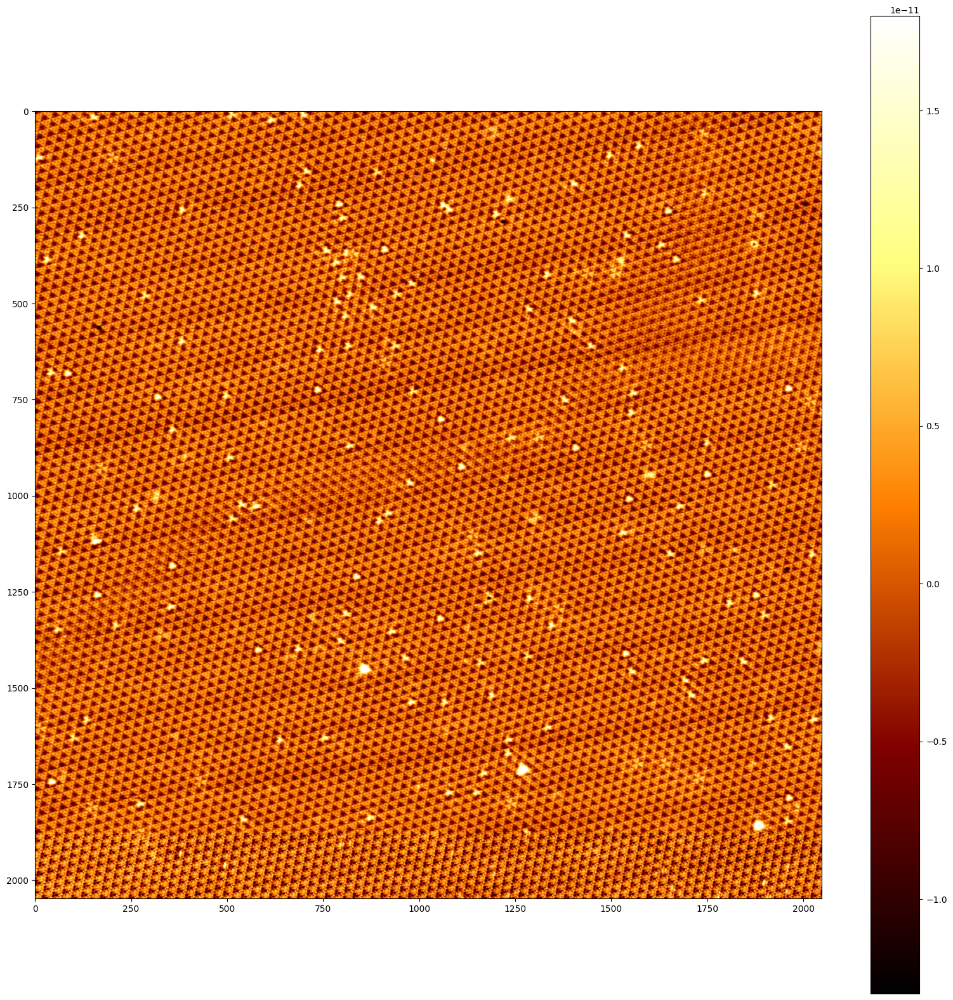

In [122]:
arr = container['/0/data']['data']
arr = arr.reshape(2048,2048)
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 20)) # Adjust the size as needed
img = plt.imshow(arr,cmap='afmhot',vmin=-13*p,vmax=18*p)
plt.colorbar()

print(img.get_clim())
img.set_clim(-13*p,18*p)
print(img.get_clim())

# Preprocessing

In [123]:
arr

array([[ 4.44493188e-12,  2.91136358e-12,  3.82213127e-12, ...,
         2.61197941e-13, -9.79377054e-13, -4.65001106e-13],
       [-6.52017983e-12, -8.52980451e-12, -7.57639731e-12, ...,
        -1.84788204e-13, -2.91039314e-12, -1.30177674e-12],
       [-7.90985624e-12, -6.94940503e-12, -8.11340825e-12, ...,
         8.72895178e-13,  5.77350773e-13,  3.89127437e-12],
       ...,
       [ 1.48534338e-12,  2.51982407e-12,  7.26536926e-13, ...,
         1.03785298e-12,  4.95334109e-12,  3.51842142e-12],
       [ 9.35193731e-13,  1.57885768e-12,  2.46429883e-12, ...,
         1.10124173e-12,  6.60834571e-12,  4.34209100e-12],
       [ 8.97706220e-13, -3.07717587e-12,  3.30784823e-12, ...,
         8.31746449e-13,  2.93535088e-12,  1.03857834e-12]])

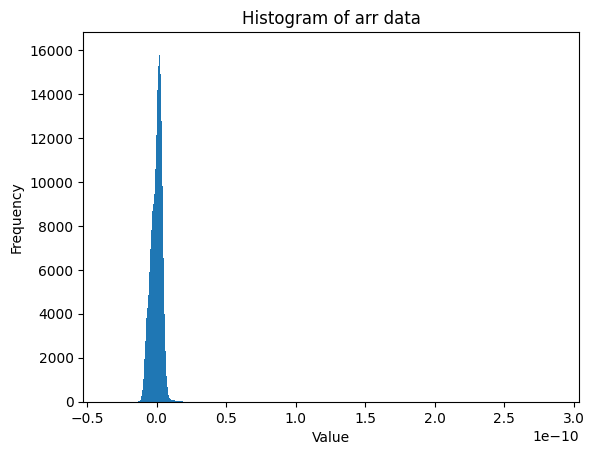

In [124]:
plt.hist(arr.flatten(), bins=10000)
plt.title('Histogram of arr data')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

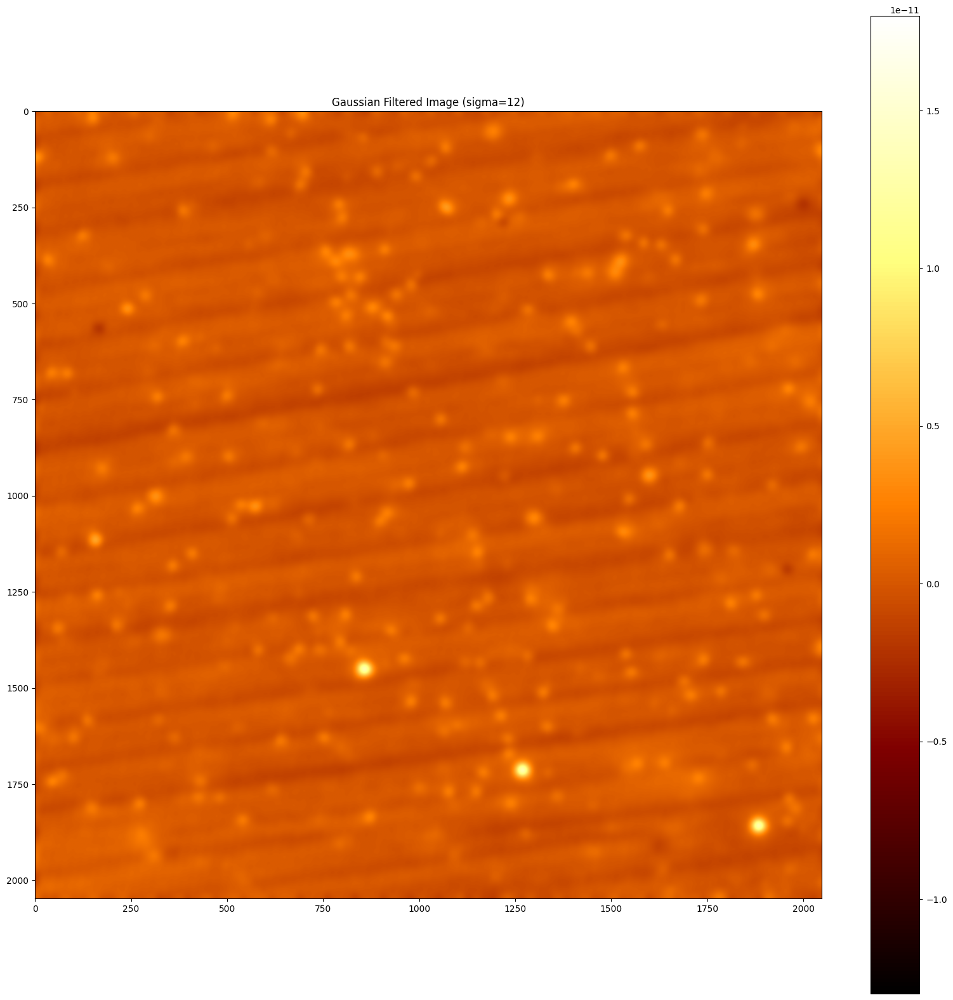

In [125]:
from scipy.ndimage import gaussian_filter

# Apply Gaussian filter
# Adjust sigma as needed for the desired amount of smoothing
sigma = 12  # Example sigma value
arr_filtered = gaussian_filter(arr, sigma=sigma)

# You can then visualize the filtered image
plt.figure(figsize=(20, 20))
plt.imshow(arr_filtered, cmap='afmhot', vmin=-13*p, vmax=18*p)
plt.colorbar()
plt.title(f'Gaussian Filtered Image (sigma={sigma})')
plt.show()

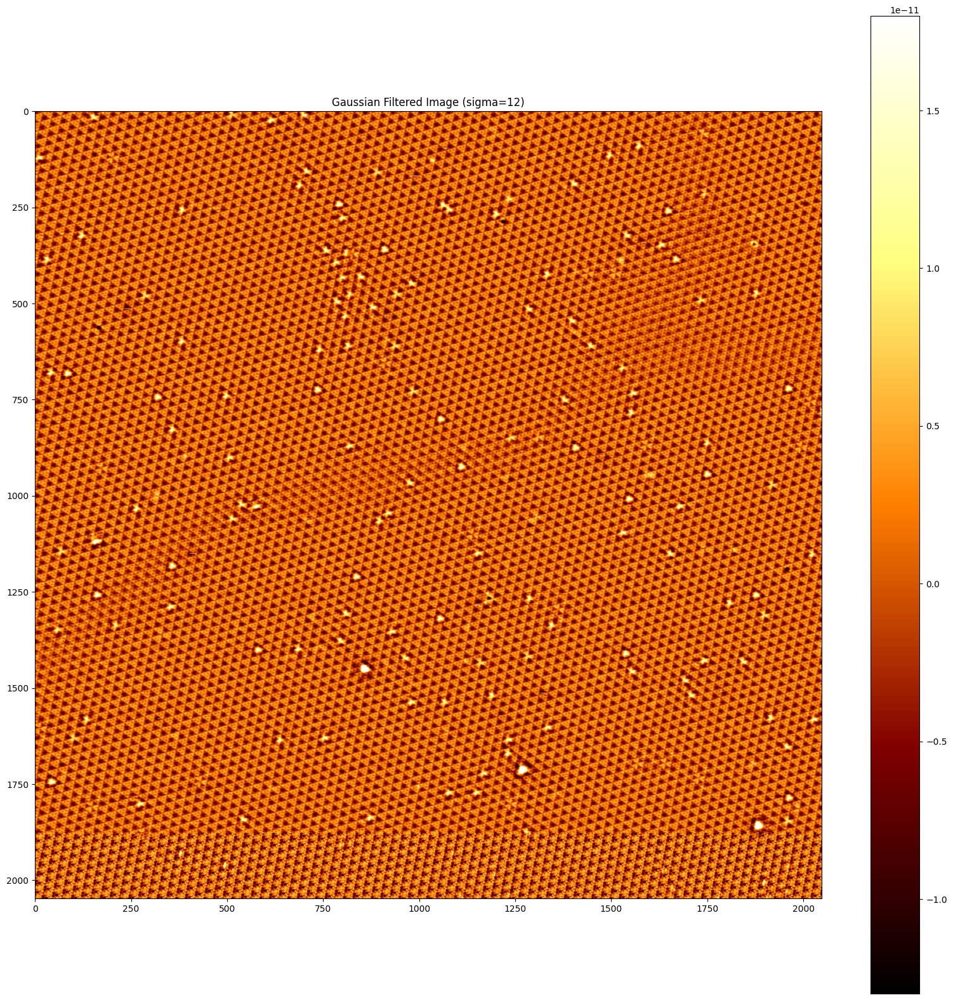

In [126]:
sigma = 12  # Example sigma value
arr_filtered = gaussian_filter(arr, sigma=sigma)
aff_br = arr - arr_filtered #background removed
# You can then visualize the filtered image
plt.figure(figsize=(20, 20))
plt.imshow(aff_br, cmap='afmhot', vmin=-13*p, vmax=18*p)
plt.colorbar()
plt.title(f'Gaussian Filtered Image (sigma={sigma})')
plt.show()

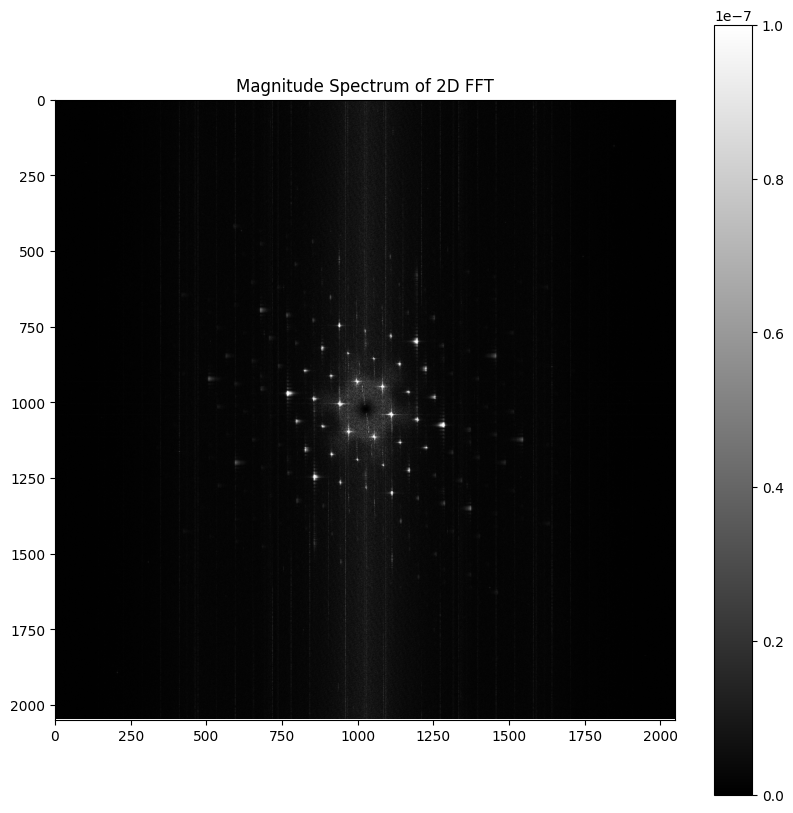

In [127]:
from scipy.fft import fft2, fftshift

# Compute the 2D FFT
fft_result = fft2(aff_br)

# Shift the zero-frequency component to the center
fft_result_shifted = fftshift(fft_result)

# Compute the magnitude spectrum (absolute value)
magnitude_spectrum = np.abs(fft_result_shifted)

# Visualize the magnitude spectrum
plt.figure(figsize=(10, 10))

# Use log scale for better visualization
log_magnitude_spectrum = np.log(magnitude_spectrum + 1)

# --- Adjust vmin and vmax here ---
# You can inspect the histogram of log_magnitude_spectrum to find appropriate limits
# plt.hist(log_magnitude_spectrum.flatten(), bins=100)
# plt.show()

vmin = 0 # Example lower limit - Adjust this value
vmax = 0.0000001 # Example upper limit - Adjust this value
# ---------------------------------


plt.imshow(log_magnitude_spectrum, cmap='gray', vmin=vmin, vmax=vmax)
plt.title('Magnitude Spectrum of 2D FFT')
plt.colorbar()
plt.show()

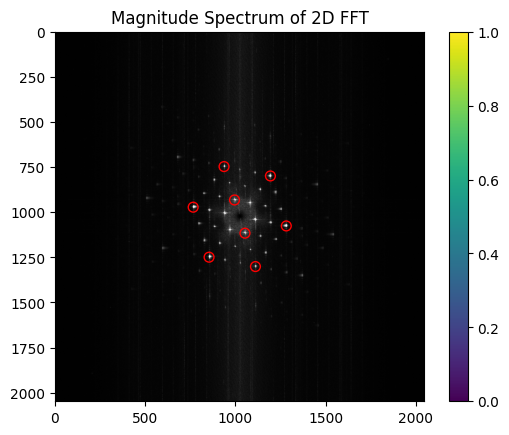

In [128]:
from skimage.feature import peak_local_max
coordinates = peak_local_max(log_magnitude_spectrum, min_distance=100, threshold_abs=.0000002)
#print(coordinates)
plt.imshow(log_magnitude_spectrum, cmap='gray', vmin=vmin, vmax=vmax)
plt.scatter(coordinates[:, 1], coordinates[:, 0], s=50, facecolors='none', edgecolors='r')
plt.title('Magnitude Spectrum of 2D FFT')
plt.colorbar()
plt.show()

In [129]:
coordinates

array([[ 932,  995],
       [1116, 1053],
       [ 747,  937],
       [1301, 1111],
       [ 799, 1194],
       [1249,  854],
       [ 972,  766],
       [1076, 1282]])

In [130]:
average_coordinates = np.mean(coordinates, axis=0)
average_coordinates

array([1024., 1024.])

In [131]:
# Subtract the column-wise average from the coordinates
centered_coordinates = coordinates - average_coordinates

print("Coordinates after subtracting column-wise average:")
print(centered_coordinates)#0,1 remove

Coordinates after subtracting column-wise average:
[[ -92.  -29.]
 [  92.   29.]
 [-277.  -87.]
 [ 277.   87.]
 [-225.  170.]
 [ 225. -170.]
 [ -52. -258.]
 [  52.  258.]]


In [132]:
k1 = centered_coordinates[2]/3


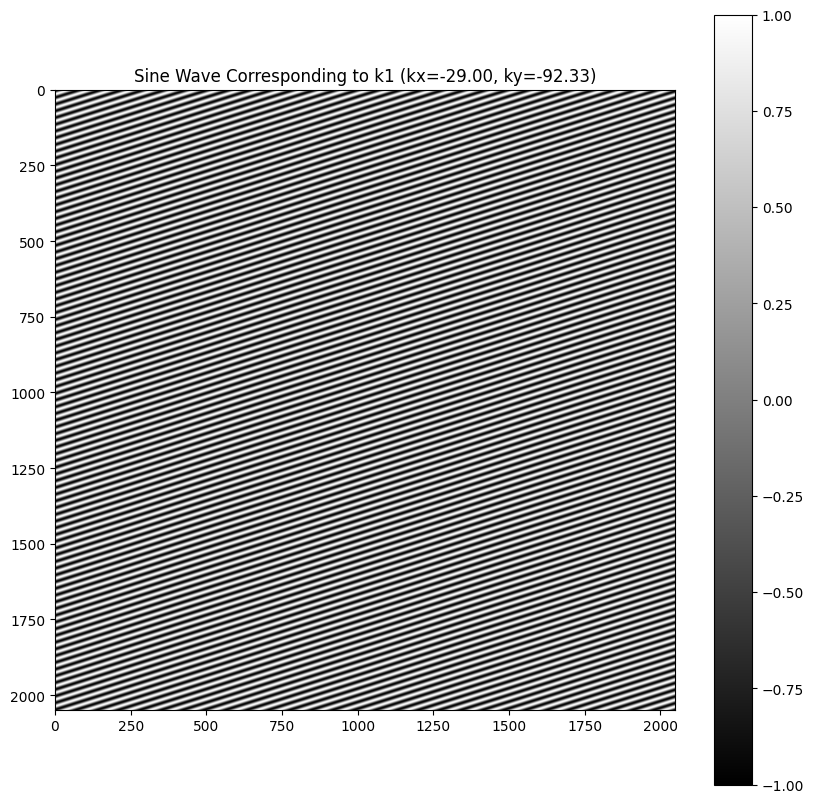

In [133]:
# Assuming k1 is a 2-element array representing a centered coordinate from the FFT output (ky_c, kx_c) in pixel units.
# We assume these centered coordinates are proportional to the spatial frequencies in cycles per pixel.
# spatial_frequency_x = k1[1] / image_width # cycles per pixel in x
# spatial_frequency_y = k1[0] / image_height # cycles per pixel in y

# Let's try a different approach for calculating the phase, directly using the centered coordinates.
# The phase of a 2D sine wave is given by 2 * pi * (fx * x + fy * y)
# Where (x, y) are spatial coordinates and (fx, fy) are spatial frequencies in cycles per unit.
# If k1 = (ky_c, kx_c) is the centered pixel coordinate in the FFT,
# the spatial frequency in cycles per pixel in the x direction is kx_c / image_width
# and in the y direction is ky_c / image_height.

# Let's use this more standard interpretation.

# Get the dimensions of the original image (arr)
image_height, image_width = arr.shape

# Create a grid of spatial coordinates (pixel indices)
y_indices, x_indices = np.indices((image_height, image_width))

# Get the centered k-vector components from k1
# k1 is assumed to be a centered coordinate (ky_c, kx_c) from the FFT
# k1 = centered_coordinates[index] # Make sure k1 is set to the desired centered coordinate before running this cell.
# Assuming k1 has been set previously, e.g., k1 = centered_coordinates[2]

kx_c = k1[1] # Centered x-coordinate (proportional to horizontal frequency)
ky_c = k1[0] # Centered y-coordinate (proportional to vertical frequency)

# Calculate spatial frequencies in cycles per pixel
# Note: The factor of 2*pi is included in the phase calculation below.
# These spatial frequencies represent the number of cycles per pixel.
spatial_freq_x_cpp = kx_c / image_width
spatial_freq_y_cpp = ky_c / image_height

# Calculate the argument for the sine wave at each pixel
# argument = 2 * pi * (spatial_freq_x_cpp * x_indices + spatial_freq_y_cpp * y_indices)
# This represents the phase of the wave at each pixel location.

# Generate the sine wave
# Using np.sin(argument) will generate a sine wave that oscillates with the specified frequencies.
# Let's also consider a cosine wave, as the phase in the FFT also contains phase information.
# For simplicity, let's start with a sine wave.

# Construct the full argument for the sine wave, including the 2*pi factor
argument = 2 * np.pi * (spatial_freq_x_cpp * x_indices + spatial_freq_y_cpp * y_indices)

# Generate the sine wave
sine_wave = np.sin(argument)

# Visualize the generated sine wave
plt.figure(figsize=(10, 10))
plt.imshow(sine_wave, cmap='gray') # Using 'gray' or a similar colormap for visualization
plt.title(f'Sine Wave Corresponding to k1 (kx={kx_c:.2f}, ky={ky_c:.2f})')
plt.colorbar()
plt.show()

In [134]:
import numpy as np

def generate_sine_wave_from_k(k_value,  arr_shape):
  """
  Generates a 2D sine wave based on a k-value (spatial frequency vector).

  Args:
    k_value: A 2-element numpy array representing the centered k-vector
             (ky_c, kx_c) in pixel units from the FFT.
    image_width: The width of the desired output image in pixels.
    image_height: The height of the desired output image in pixels.

  Returns:
    A 2D numpy array representing the sine wave.
  """
  # Get the centered k-vector components
  ky_c = k_value[0]
  kx_c = k_value[1]
  image_height, image_width = arr_shape
  # Create a grid of spatial coordinates (pixel indices)
  y_indices, x_indices = np.indices((image_height, image_width))

  # Calculate spatial frequencies in cycles per pixel
  spatial_freq_x_cpp = kx_c / image_width
  spatial_freq_y_cpp = ky_c / image_height

  # Construct the full argument for the sine wave, including the 2*pi factor
  argument = 2 * np.pi * (spatial_freq_x_cpp * x_indices + spatial_freq_y_cpp * y_indices)

  # Generate the sine wave
  sine_wave = np.sin(argument)

  return sine_wave

# Example usage (optional - you can remove this part if you just want the function definition)
# Assuming k1, image_width, and image_height are already defined
# generated_wave = generate_sine_wave_from_k(k1, image_width, image_height)
# plt.figure(figsize=(10, 10))
# plt.imshow(generated_wave, cmap='gray')
# plt.title('Generated Sine Wave from Function')
# plt.colorbar()
# plt.show()

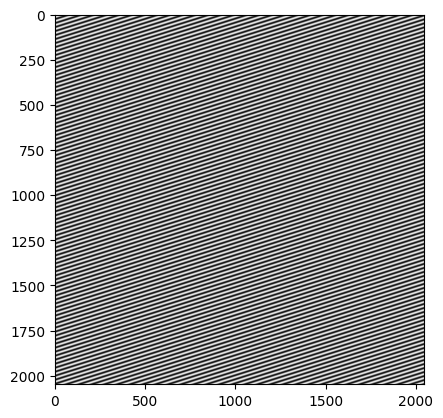

In [135]:
sinimg = generate_sine_wave_from_k(k1, arr.shape)
plt.imshow(sine_wave, cmap='gray') # Using 'gray' or a similar colormap for visualization


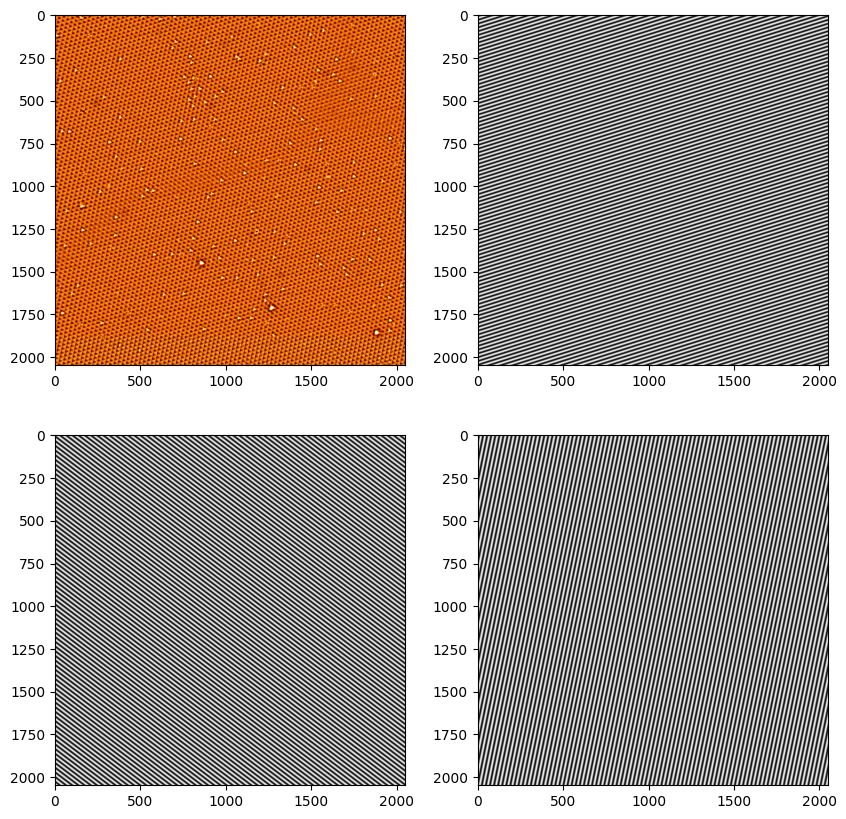

In [137]:
fig,axs = plt.subplots(2,2,figsize=(10, 10))
axs[0,0].imshow(aff_br, cmap='afmhot', vmin=-13*p, vmax=18*p)


iks = [2,4,6]
isbs = [0,1,1]
jsbs = [1,0,1]

for ik,isb,jsb in zip(iks,isbs,jsbs):
  k = centered_coordinates[ik]/3
  sinimg = generate_sine_wave_from_k(k, aff_br.shape)
  axs[isb,jsb].imshow(sinimg, cmap='gray')




One shot trial... but not works...

In [143]:
def auto_clim(data, method='percentile', lower=1, upper=99):
    """
    data: 2D array
    method: 'percentile' or 'std'
    """
    if method == 'percentile':
        vmin, vmax = np.percentile(data, [lower, upper])
    elif method == 'std':
        mean = np.mean(data)
        std = np.std(data)
        vmin, vmax = mean - std, mean + std
    else:
        raise ValueError("method must be 'percentile' or 'std'")
    return vmin, vmax


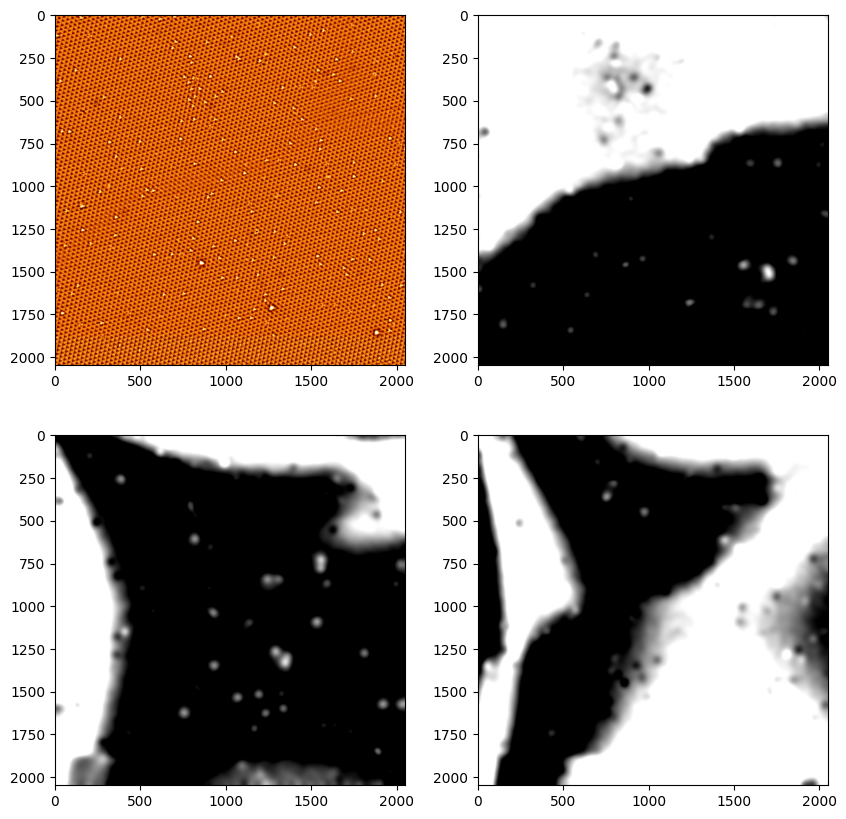

In [164]:
fig,axs = plt.subplots(2,2,figsize=(10, 10))
axs[0,0].imshow(aff_br, cmap='afmhot', vmin=-13*p, vmax=18*p)


iks = [2,4,6]
isbs = [0,1,1]
jsbs = [1,0,1]

for ik,isb,jsb in zip(iks,isbs,jsbs):
  k = centered_coordinates[ik]
  sinimg_atom = generate_sine_wave_from_k(k, aff_br.shape)
  sinprod_atom = sinimg_atom*aff_br
  sinprod_atom = gaussian_filter(sinprod_atom,20)
  sinimg_CDW = generate_sine_wave_from_k(k/3, aff_br.shape)
  sinprod_CDW = sinimg_CDW*aff_br
  sinprod_CDW = gaussian_filter(sinprod_CDW,20)
  sinprod_CDW_rm = sinprod_CDW-sinprod_atom
  vmin, vmax = auto_clim(sinprod, method='percentile', lower=1, upper=99)
  axs[isb,jsb].imshow(sinprod_CDW_rm, cmap='gray', vmin=vmin, vmax=vmax)

Okay, let's do it step-by-step

In [176]:
def generate_sine_wave_from_k(k_value,  arr_shape,phi):
  """
  Generates a 2D sine wave based on a k-value (spatial frequency vector).

  Args:
    k_value: A 2-element numpy array representing the centered k-vector
             (ky_c, kx_c) in pixel units from the FFT.
    image_width: The width of the desired output image in pixels.
    image_height: The height of the desired output image in pixels.

  Returns:
    A 2D numpy array representing the sine wave.
  """
  # Get the centered k-vector components
  ky_c = k_value[0]
  kx_c = k_value[1]
  image_height, image_width = arr_shape
  # Create a grid of spatial coordinates (pixel indices)
  y_indices, x_indices = np.indices((image_height, image_width))

  # Calculate spatial frequencies in cycles per pixel
  spatial_freq_x_cpp = kx_c / image_width
  spatial_freq_y_cpp = ky_c / image_height

  # Construct the full argument for the sine wave, including the 2*pi factor
  argument = 2 * np.pi * (spatial_freq_x_cpp * x_indices + spatial_freq_y_cpp * y_indices) + phi

  # Generate the sine wave
  sine_wave = np.sin(argument)

  return sine_wave

# Example usage (optional - you can remove this part if you just want the function definition)
# Assuming k1, image_width, and image_height are already defined
# generated_wave = generate_sine_wave_from_k(k1, image_width, image_height)
# plt.figure(figsize=(10, 10))
# plt.imshow(generated_wave, cmap='gray')
# plt.title('Generated Sine Wave from Function')
# plt.colorbar()
# plt.show()

In [173]:
ks = centered_coordinates[[2,4,6]]

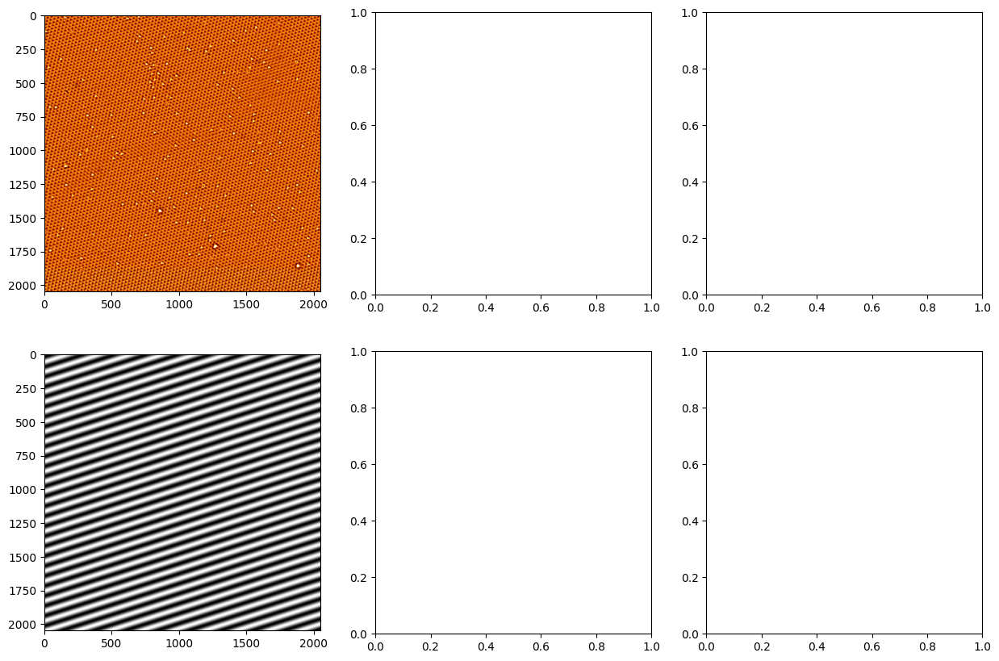

In [184]:
ik = 0

fig,axs = plt.subplots(2,3,figsize=(15, 10))
axs[0,0].imshow(aff_br, cmap='afmhot', vmin=-13*p, vmax=18*p)
k = ks[ik]/10
sw = generate_sine_wave_from_k(k,  aff_br.shape,0)
axs[1,0].imshow(sw, cmap='gray')